# MTH3302 - Méthodes probabilistes et statistiques pour I.A.
#### Polytechnique Montréal


### Projet A2024

-----

# Prédiction de la consommation en carburant de voitures récentes.

### Description

Ce jeu de données contient la consommation moyenne de presque 400 véhicules en L/100km et d'autres caractèristiques.

La variable d'intérêt est:

 - consommation: la consommation en L/100km.

Les autres variables sont:

 - année: l'année du modèle
 - type: le type de véhicule
 - nombre_cylindres: le nombre de cylindres du moteur
 - cylindree: la cylindrée du moteur en L
 - transmission: le type de transmission (propulsion, traction, 4x4 et intégrale)
 - boite: le type de boite de vitesses (automatique ou manuelle)


### 1. Prétraitement des données

In [390]:
#Importation des librairies importantes utilisées dans le calepin:
using CSV
using DataFrames
using Distributions
using Gadfly
using LinearAlgebra
using Statistics
using Random
using StatsBase
using MLBase
using CategoricalArrays
using Plots
using StatsPlots

### 1.1 Première analyse des données

Le prétraitement des données est une étape cruciale pour garantir que les modèles d'apprentissage automatique puissent apprendre de manière efficace. Ce processus commence par une **analyse initiale des données** pour comprendre la structure des données, la présence de valeurs manquantes, et la distribution des variables. Nous avons d'abord débuté par explorer la structure de la table des données afin d'avoir une idée sur les caractéristiques des données et des potentielles variables explicatives. Ça nous permet aussi de voir les type de valeurs des caratéristiques afin de savoir lesquels transformer ou encoder par la suite.

In [391]:
# Charger les données
df = CSV.read("train.csv", DataFrame,decimal=',')

Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
6,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
7,2022,voiture_minicompacte,3,1.5,traction,automatique,7.35031
8,2024,voiture_minicompacte,3,1.5,traction,manuelle,7.58742
9,2020,VUS_standard,6,3.8,integrale,automatique,11.2005


In [392]:
# Vérifier les noms exacts des colonnes
println("\nVérification des noms des colonnes:")
println(names(df))


Vérification des noms des colonnes:
["annee", "type", "nombre_cylindres", "cylindree", "transmission", "boite", "consommation"]


In [393]:
# Exploration initiale
println("Premières lignes du DataFrame:")
println(first(df, 5))


Premières lignes du DataFrame:
5×7 DataFrame
 Row │ annee  type                 nombre_cylindres  cylindree  transmission  boite        consommation 
     │ Int64  String31             Int64             Float64    String15      String15     Float64      
─────┼──────────────────────────────────────────────────────────────────────────────────────────────────
   1 │  2023  voiture_moyenne                     8        4.4  integrale     automatique      13.8359
   2 │  2020  VUS_petit                           4        2.0  integrale     automatique       9.80042
   3 │  2021  voiture_compacte                    6        3.3  propulsion    automatique      11.7605
   4 │  2023  voiture_deux_places                 8        5.0  integrale     automatique      13.0672
   5 │  2022  voiture_moyenne                     8        4.4  integrale     automatique      13.8359


In [394]:
#Statistiques descriptives (moyenne, médiane, écart-type, etc.)
println("\nDescription du DataFrame:")
println(describe(df))



Description du DataFrame:
7×7 DataFrame
 Row │ variable          mean     min          median   max                    nmissing  eltype   
     │ Symbol            Union…   Any          Union…   Any                    Int64     DataType 
─────┼────────────────────────────────────────────────────────────────────────────────────────────
   1 │ annee             2019.19  2014         2019.0   2024                          0  Int64
   2 │ type                       VUS_petit             voiture_sous_compacte         0  String31
   3 │ nombre_cylindres  5.28535  3            4.0      12                            0  Int64
   4 │ cylindree         2.90303  1.2          2.5      6.8                           0  Float64
   5 │ transmission               4x4                   traction                      0  String15
   6 │ boite                      automatique           manuelle                      0  String15
   7 │ consommation      10.3568  4.52327      10.2265  16.8007                  

In [395]:
#Statistiques descriptives par colonne
println("\nStatistiques descriptives par colonne:")
for col in names(df)
    println("Colonne: $col")
    println(describe(df[!, col]))
end


Statistiques descriptives par colonne:
Colonne: annee
Summary Stats:
Length:         396
Missing Count:  0
Mean:           2019.194444
Minimum:        2014.000000
1st Quartile:   2016.000000
Median:         2019.000000
3rd Quartile:   2022.000000
Maximum:        2024.000000
Type:           Int64
nothing
Colonne: type
Summary Stats:
Length:         396
Type:           String31
Number Unique:  13
nothing
Colonne: nombre_cylindres
Summary Stats:
Length:         396
Missing Count:  0
Mean:           5.285354
Minimum:        3.000000
1st Quartile:   4.000000
Median:         4.000000
3rd Quartile:   6.000000
Maximum:        12.000000
Type:           Int64
nothing
Colonne: cylindree
Summary Stats:
Length:         396
Missing Count:  0
Mean:           2.903030
Minimum:        1.200000
1st Quartile:   2.000000
Median:         2.500000
3rd Quartile:   3.500000
Maximum:        6.800000
Type:           Float64
nothing
Colonne: transmission
Summary Stats:
Length:         396
Type:           String

Nous avons par la suite regardé si des valeurs manquantes étaient présentes dans la table de données car cela pourrait causer problème lors du traitement des données. Dans ce cas ici, il n'y en avait pas mais s'il y en avait eu, il aurait fallut prendre la décision soit de les enlever ou de les remplacer par une valeur adéquate.

In [396]:
# Vérifier s'il y a des valeurs manquantes dans le dataframe

missing_per_row = any(row -> any(ismissing, row), eachrow(df))
println("Y a t'il des valeurs manquantes ? ", missing_per_row)



Y a t'il des valeurs manquantes ? false


Nous avons tenté ici d'afficher la distribution de chaque caractéritiques en fonction de la variable d'intérêt afin de voir si une tendance était reconnaissable et pourrait guider notre choix de modèle. Cependant, dans ce cas ci, aucune tendance claire ne pouvait être identifiée.

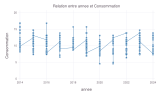

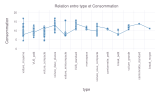

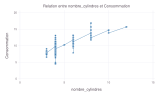

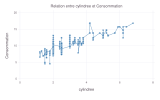

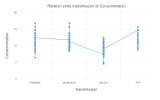

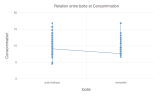

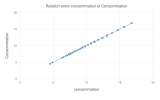

In [397]:
# Visualisation des données

# Identifier les colonnes, excluant 'consommation'
numeric_cols = names(df, eltype.(eachcol(df)) .== Float64)
numeric_cols = setdiff(numeric_cols, [:consommation])


# Boucler sur les colonnes et tracer les points
for feature in names(df)
    try
        p = Gadfly.plot(df, 
                 x = feature, 
                 y = :consommation, 
                 Geom.line, 
                 Geom.point,
                 Guide.xlabel(string(feature)), 
                 Guide.ylabel("Consommation"), 
                 Guide.title("Relation entre $feature et Consommation"),
                 Theme(default_color = "steelblue"))  # Définir la couleur des points

        # Afficher le graphique
        display(p)
    catch e
        println("Erreur lors du tracé de '$feature' : ", e)
    end
end

On peut également afficher les consommations totales par année par type de vehicule afin d'avoir une vue d'ensemble sur les vehicules ayant le plus consommé.

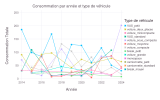

In [398]:

df_grouped = combine(groupby(df, [:annee, :type]), :consommation => sum => :total_consommation)

set_default_plot_size(16cm, 10cm)

p = Gadfly.plot(
    df_grouped, 
    x = :annee, 
    y = :total_consommation,
    color = :type, 
    Geom.line, 
    Geom.point,
    Guide.title("Consommation par année et type de véhicule"),
    Guide.xlabel("Année"),
    Guide.ylabel("Consommation Totale"),
    Guide.colorkey(title = "Type de véhicule")
)

display(p)



On peut voir qu'en 2014, 2017 et 2024 les VUS_petit et les voiture_sous_compacte ont beaucoup consommé

On peut également afficher la consommation totale par type de véhicule et cylindree

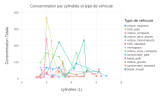

In [399]:

df_grouped = combine(groupby(df, [:type, :cylindree]), :consommation => sum => :total_consommation)

set_default_plot_size(16cm, 10cm)

p = Gadfly.plot(
    df_grouped, 
    x = :cylindree, 
    y = :total_consommation,
    color = :type, 
    Geom.line, 
    Geom.point,
    Guide.title("Consommation par cylindrée et type de véhicule"),
    Guide.xlabel("cylindree (L)"),
    Guide.ylabel("Consommation Totale"),
    Guide.colorkey(title = "Type de véhicule")
)

display(p)


On observe que pour les VUS_petit on la plus grande consommation (environ 380L sur le graphique) avec une cylindree de 2L. Suivie des voiture_compacte et des voitures a deux place avec une cylindre de 2, 3 et 5L 

In [400]:
# Voir s'il y'a présence de valeurs abérante
function plot_boxplot(df, feature::Symbol)
    df_numeric = select(df, feature)
    if !isempty(df_numeric)
        boxplot(Matrix(df_numeric), labels=[string(feature)], title="Valeur abberante pour $(feature)")
    else
        println("Aucune donnée numérique à afficher.")
    end
end


plot_boxplot (generic function with 1 method)

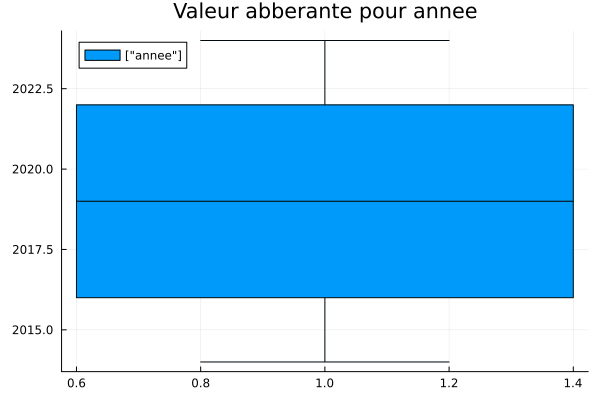

In [401]:
plot_boxplot(df, :annee)

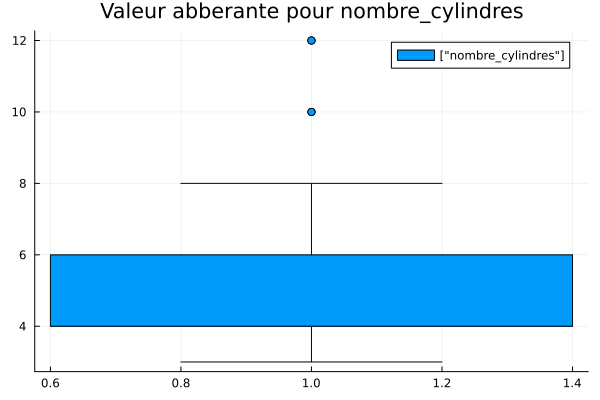

In [402]:
plot_boxplot(df, :nombre_cylindres)

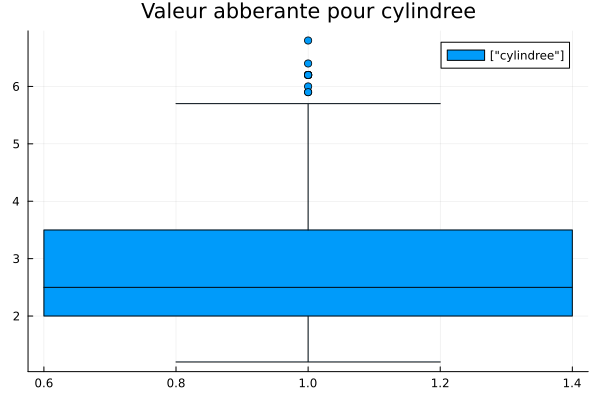

In [403]:
plot_boxplot(df, :cylindree)

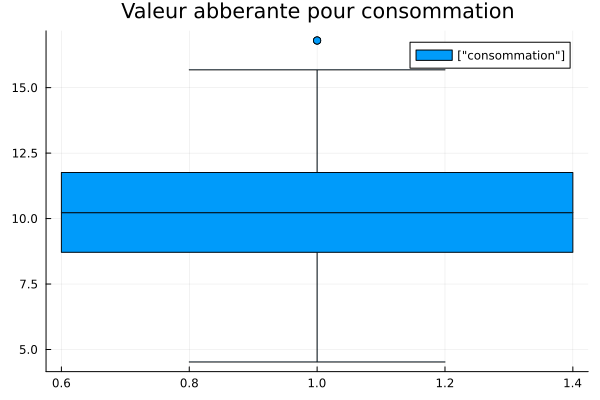

In [404]:
plot_boxplot(df, :consommation)

Les boxplots ci-dessus nous montrent clairement la présence de valeurs abbérantes pour les variables 'consommation', 'cylindree' et 'nombre_cylindre'

Nous avons ainsi trouvé pertinent de traiter les données numériques aberrantes en les retirant de nos données de traitement puisqu'elles risquent d'influencer (biaiser) nos prédictions. En effet, nous avons pu voir notre RMSE diminuer avec l'ajout du traitement des données abérrantes, il est passé de 0.9275 à 0.91145.

In [405]:
function remove_outliers(df::DataFrame, numeric_columns::Vector{Symbol})
    for col in numeric_columns
        # Calcul deQ1 et Q3 en ignorant les valeurs manquantes
        Q1 = quantile(skipmissing(df[!, col]), 0.25)
        Q3 = quantile(skipmissing(df[!, col]), 0.75)
        IQR = Q3 - Q1
        # Calcul des bornes inférieure et supérieure
        lower= Q1 - 1.5 * IQR
        upper= Q3 + 1.5 * IQR
        original_size = nrow(df)
        # Filtration des données pour supprimer les outliers
        df = df[(df[!, col] .>= lower) .& (df[!, col] .<= upper), :]
        new_size = nrow(df)
        println("Nombre de valeurs aberrantes supprimées dans '$(col)': $(original_size - new_size)")
    end
    return df
end

# Sélectionner les colonnes numériques
numeric_columns = [col for (col, col_type) in zip(names(df), eltype.(eachcol(df))) if col_type <: Number]

# Convertir les noms de colonnes de String à Symbol
numeric_columns = Symbol.(numeric_columns)

# Supprimer les outliers
df_clean = remove_outliers(df, numeric_columns)


Nombre de valeurs aberrantes supprimées dans 'annee': 0
Nombre de valeurs aberrantes supprimées dans 'nombre_cylindres': 6
Nombre de valeurs aberrantes supprimées dans 'cylindree': 15
Nombre de valeurs aberrantes supprimées dans 'consommation': 2


Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
6,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
7,2022,voiture_minicompacte,3,1.5,traction,automatique,7.35031
8,2024,voiture_minicompacte,3,1.5,traction,manuelle,7.58742
9,2020,VUS_standard,6,3.8,integrale,automatique,11.2005


### 1.2 Encodage One-Hot

Ensuite, nous avons encodé les caractéristiques non-numériques afin qu'elles soit interprétables par le modèle. L'encodage qui nous a permis d'avoir les meilleurs résultats est l'encodage one-hot donc nous ne présenterons que celui là ici. Nous sommes passées de 6 caractéristiques à 22 avec cet encodage puisqu'il considère chaque valeur de chaque caractéristique comme une caractéristique à part entière qui serait présente (1) ou absente (0). Nous avons ainsi encodé les colonnes types, transmission et boite qui comprenait des valeurs de type String.

In [406]:
# Afficher les valeurs uniques pour chaque features catégorique

function display_categorical_values(df::DataFrame)
    for col in names(df)
        if eltype(df[!, col]) <: AbstractString
            println("Categorical Feature: $col")
            println("Unique values: ", unique(df[!, col]))
            println("Number of unique values: ", length(unique(df[!, col])))
            println()
        end
    end
end

display_categorical_values(df)

Categorical Feature: type
Unique values: String31["voiture_moyenne", "VUS_petit", "voiture_compacte", "voiture_deux_places", "voiture_minicompacte", "VUS_standard", "monospace", "voiture_sous_compacte", "camionnette_petit", "break_petit", "voiture_grande", "camionnette_standard", "break_moyen"]
Number of unique values: 13

Categorical Feature: transmission
Unique values: String15["integrale", "propulsion", "traction", "4x4"]
Number of unique values: 4

Categorical Feature: boite
Unique values: String15["automatique", "manuelle"]
Number of unique values: 2



In [407]:
# Définition de la fonction d'encodage one-hot

function onehot_encode(df, cols; drop_original::Bool=true)
    for col in cols
        if col in names(df)
            categories = unique(df[!, col])
            for category in categories
                # Nettoyer le nom de la catégorie pour éviter les problèmes de syntaxe
                clean_category = replace(string(category), r"\s+" => "_", r"[^\w]" => "")
                new_col = Symbol(string(col, "_", clean_category))
                df[!, new_col] = Int.(df[!, col] .== category)
            end
            if drop_original
                select!(df, Not(col))
            end
            println("Encodage one-hot de la colonne '$col' réussi.")
        else
            println("La colonne '$col' n'existe pas dans le DataFrame.")
        end
    end
    return df
end

onehot_encode (generic function with 1 method)

In [408]:
# Colonnes non numériques
categorical_cols = ["type", "transmission", "boite"]

# Convertion des colonnes non numériques en type categorical
for col in categorical_cols
    if col in names(df)
        df[!, col] = categorical(df[!, col])
    else
        println("La colonne '$col' n'existe pas dans le DataFrame.")
    end
end

# Application du one-hot encoding
df_onehot = onehot_encode(df, categorical_cols)

println("Colonnes après encodage one-hot:")
println(names(df_onehot))

println("Premières lignes du DataFrame encodé:")
println(first(df_onehot, 5))

Encodage one-hot de la colonne 'type' réussi.
Encodage one-hot de la colonne 'transmission' réussi.
Encodage one-hot de la colonne 'boite' réussi.
Colonnes après encodage one-hot:
["annee", "nombre_cylindres", "cylindree", "consommation", "type_voiture_moyenne", "type_VUS_petit", "type_voiture_compacte", "type_voiture_deux_places", "type_voiture_minicompacte", "type_VUS_standard", "type_monospace", "type_voiture_sous_compacte", "type_camionnette_petit", "type_break_petit", "type_voiture_grande", "type_camionnette_standard", "type_break_moyen", "transmission_integrale", "transmission_propulsion", "transmission_traction", "transmission_4x4", "boite_automatique", "boite_manuelle"]
Premières lignes du DataFrame encodé:
5×23 DataFrame
 Row │ annee  nombre_cylindres  cylindree  consommation  type_voiture_moyenne  type_VUS_petit  type_voiture_compacte  type_voiture_deux_places  type_voiture_minicompacte  type_VUS_standard  type_monospace  type_voiture_sous_compacte  type_camionnette_petit  ty

### 1.3 Corrélation et VIF





La matrice de corrélation nous a permis d'identifier les caractéristiques les plus corrélées entre elles. Garder des caractéristiques corrélées comme variables explicatives peut fausser notre modèle, car **l'impact d'une variable fortement corrélée est amplifié de manière artificielle**. Dans ce cas précis, nous avons constaté que les variables *nombre_cylindres* et *cylindrée* sont fortement corrélées, avec une corrélation de *0.9434377163852758*, ce qui est très proche de *1*. Cela n'est pas surprenant, **car ces deux variables décrivent des aspects similaires du moteur.**

Nous avons fixé un seuil de corrélation à *0.8* ; les variables ayant une corrélation supérieure à ce seuil ont été considérées comme corrélées et filtrées. Nous avons donc décidé de conserver uniquement la variable *cylindrée*, ce qui nous a permis d'améliorer notre *RMSE*.



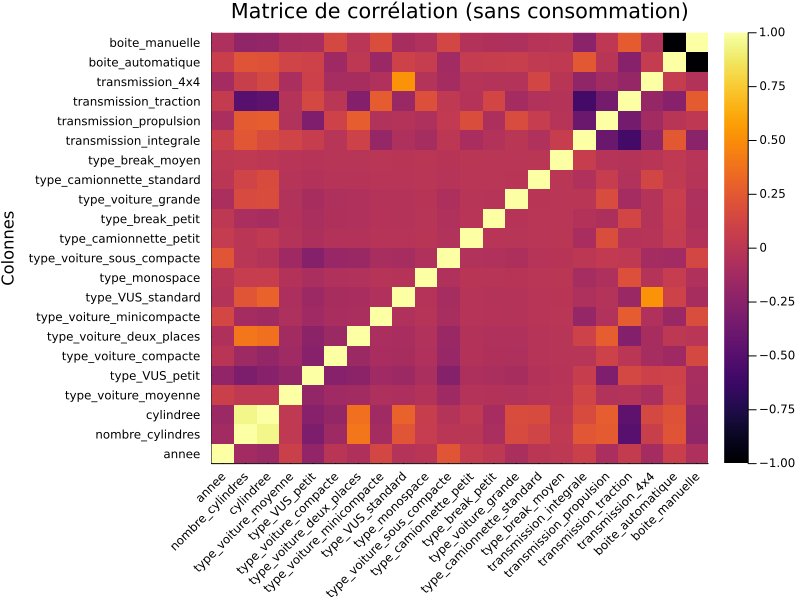

In [409]:
# Suppression de la colonne 'consommation' (variable d'intérêt)
df_no_target = select(df_onehot, Not(:consommation))

# Calcul de la matrice de corrélation
correlation_matrix = cor(Matrix(df_no_target))

# Création d'un heatmap
heatmap(correlation_matrix,
        xlabel="Colonnes", ylabel="Colonnes",
        title="Matrice de corrélation (sans consommation)",
        xrotation=45,
        xticks=(1:size(correlation_matrix, 1), names(df_no_target)),
        yticks=(1:size(correlation_matrix, 2), names(df_no_target)),
        size=(800, 600))  # Taille de la figure : (largeur, hauteur)



On remarque dans la matrice de corrélation ci-dessus que les colonnes **'cylindree'** et **'nombre_cylindres'** présentent une forte corrélation (avec un coefficient proche de *1.0*), ce qui est plutôt logique étant donné la relation intrinsèque entre ces deux variables. De même, on observe une corrélation négative marquée (proche de *-1.0*) entre les variables **'boite_automatique'** et **'boite_manuelle'**, ce qui est attendu puisque ces deux catégories sont mutuellement exclusives.

Afin de mieux analyser les résultats et éviter des redondances dans le modèle, nous décidons d’afficher uniquement les colonnes ayant un seuil de corrélation supérieur à *0.8*. Cela nous permettra d’identifier les relations les plus significatives et d’affiner notre analyse.



In [410]:
y = df_onehot[!, :consommation]  
X = select(df_onehot, Not(:consommation))


# Trouver les paires de variables avec une corrélation > abs(0.8)
n = size(correlation_matrix, 1)
high_corr_pairs = []

for i in 1:n
    for j in i+1:n
        if abs(correlation_matrix[i, j]) > 0.8
            push!(high_corr_pairs, (names(df)[i], names(df)[j], correlation_matrix[i, j]))
        end
    end
end

# Affichage des paires de variables
println("Paires de variables avec une corrélation > 0.8:")
for pair in high_corr_pairs
    println("$(pair[1]) et $(pair[2]) : Corrélation = $(pair[3])")
end


Paires de variables avec une corrélation > 0.8:
nombre_cylindres et cylindree : Corrélation = 0.9434377163852762
transmission_4x4 et boite_automatique : Corrélation = -1.0






En ce qui concerne la corrélation avec la variable d'intérêt **'consommation'**, on observe que **'nombre_cylindres'** et **'cylindree'** sont toutes deux fortement corrélées à cette variable (avec des coefficients de **0.82** et **0.83** respectivement), en plus d’être corrélées entre elles. Cela indique qu’elles exercent un fort impact sur la prédiction de la consommation.

Une approche pertinente pourrait consister à conserver uniquement l’une de ces deux variables. Dans ce cas, **'cylindree'** semble être un meilleur choix puisqu’elle est légèrement plus corrélée à la variable d’intérêt que **'nombre_cylindres'**.

Cependant, après quelques expérimentations, le retrait de la colonne **'nombre_cylindres'** entraîne une augmentation du RMSE. On choisit donc de conserver cette colonne. Cela peut s’expliquer par le nombre limité de données et de variables disponibles dans le dataset. Retirer l’une de ces colonnes reviendrait à perdre une quantité d’information plus importante que prévu, ce qui compromettrait la performance du modèle.



**VIF:**

Ensuite, nous avons choisi de calculer le **VIF** des variables explicatives pour avoir une autre preuve de présence de multicolinéarité. Nous avons retiré les colonnes issues du one hot encoding étant donné leur corrélation évidente entre elles.

In [411]:
# Liste des colonnes one hot à exclure, incluant 'consommation'
cols_to_exclude = [
    :consommation, :type_voiture_moyenne, :type_VUS_petit, :type_voiture_compacte,
    :type_voiture_deux_places, :type_voiture_minicompacte, :type_VUS_standard,
    :type_monospace, :type_voiture_sous_compacte, :type_camionnette_petit,
    :type_break_petit, :type_voiture_grande, :type_break_moyen,
    :transmission_integrale, :transmission_propulsion, :transmission_traction,
    :transmission_4x4, :boite_automatique, :boite_manuelle
]

# Nouveau DataFrame sans ces colonnes
df_no_onehot_cols = select(df_onehot, Not(cols_to_exclude))

Row,annee,nombre_cylindres,cylindree,type_camionnette_standard
,Int64,Int64,Float64,Int64
1,2023,8,4.4,0
2,2020,4,2.0,0
3,2021,6,3.3,0
4,2023,8,5.0,0
5,2022,8,4.4,0
6,2022,8,4.4,0
7,2022,3,1.5,0
8,2024,3,1.5,0
9,2020,6,3.8,0


In [412]:
function calculate_vif_noformula(df)
    vif_values = Dict{String, Float64}()
    
    for col in names(df)  # 'col' est une chaîne de caractères
        # Matrice des prédicteurs (toutes les autres colonnes)
        X = select(df, Not(col)) |> Matrix
        # Colonne cible (variable courante)
        y = df[:, col]
        
        # Ajustement de la régression linéaire : projection de y sur X
        β = X \ y  # Résolution des moindres carrés
        y_hat = X * β  # Valeurs prédites
        residuals = y - y_hat  # Résidus
        
        # Calcul du R²
        ss_total = sum((y .- mean(y)).^2)  # Somme des carrés totaux
        ss_residual = sum(residuals.^2)   # Somme des carrés des résidus
        r_squared = 1 - (ss_residual / ss_total)
        
        # Calcul du VIF
        vif_values[col] = 1 / (1 - r_squared)
    end
    
    return vif_values
end

# Calcul du VIF
vif_result = calculate_vif_noformula(df_no_onehot_cols)

# Affichage des résultats
println("VIF pour chaque variable :")
for (col, vif) in vif_result
    println("$col : $vif")
end

VIF pour chaque variable :
type_camionnette_standard : 1.04816724414989
cylindree : 9.423250858962264
annee : 3.0291338203283438e-5
nombre_cylindres : 9.279458933035473



Ici, le VIF élevé (supérieur à 10) confirme que **'nombre_cylindres'** et **'cylindree'** sont des variables fortement corrélées.  

D’autre part, le faible VIF de **'annee'** indique qu’il n’existe quasiment aucune colinéarité entre cette variable et les autres variables explicatives.  



### 1.4 Standarisation des données

In [413]:
# Standardisation des valeurs continues
function standardize_selected_columns(X, numeric_columns)
    X_matrix = Matrix{Float64}(X)
    col_names = names(X)
    
    for col in numeric_columns
        if col in col_names
            col_idx = findfirst(==(col), col_names)
            col_mean = mean(X_matrix[:, col_idx])
            col_std = std(X_matrix[:, col_idx])

            if col_std > 0
                X_matrix[:, col_idx] = (X_matrix[:, col_idx] .- col_mean) ./ col_std
            else
                println("Avertissement : L'écart-type de la colonne '$col' est nul. La standardisation n'a pas été effectuée.")
            end
        else
            println("Avertissement : La colonne '$col' n'a pas été trouvée dans X.")
        end
    end
    
    return X_matrix
end



standardize_selected_columns (generic function with 1 method)

### 1.5 Normalisation des données

Nous avons essayé de normaliser les valeurs continues pour voir si le modèle performait mieux. Cependant, nous n'avons pas obtenu de bons résultats. Une hypothèse à cela serait que le fait d'avoir encodé les données avec **one-hot** implique que les caractéristiques ont maintenant des valeurs de 0 ou 1. La normalisation risque alors d'affecter l'interprétabilité de ces 0 et 1, qui signifient l'absence ou la présence d'une caractéristique, ce qui pourrait expliquer pourquoi le modèle performerait moins bien.


Voici une version adaptée pour normaliser uniquement les variables qui sont numériques, de sorte que les variables avec l'encodage 0 et 1 ne seront pas affectées, permettant ainsi une normalisation efficace.

In [414]:
# Fonction pour normaliser uniquement les colonnes numériques
function normalize_selected_columns(X, numeric_columns)
    X_matrix = Matrix{Float64}(X)
    col_names = names(X)
    
    for col in numeric_columns
        if col in col_names
            col_idx = findfirst(==(col), col_names)
            col_mean = mean(X_matrix[:, col_idx])
            col_std = std(X_matrix[:, col_idx])
            
            # Normaliser la colonne si l'écart-type est non nul
            if col_std > 0
                X_matrix[:, col_idx] = (X_matrix[:, col_idx] .- col_mean) ./ col_std
            end
        end
    end
    return X_matrix
end

normalize_selected_columns (generic function with 1 method)

### 2. Entraînement et test avec toutes les variables explicatives

### 2.1.1 Régression linéaire simple avec encodage 1,2,3

In [415]:

# Chargement des données
df = CSV.read("train.csv", DataFrame,decimal=',');
df_test=CSV.read("test.csv",DataFrame,decimal=',');

# Sélectionner les colonnes numériques
numeric_columns = [col for (col, col_type) in zip(names(df), eltype.(eachcol(df))) if col_type <: Number]

# Convertir les noms de colonnes de String à Symbol
numeric_columns = Symbol.(numeric_columns)

# Supprimer les outliers
df_clean = remove_outliers(df, numeric_columns)


Nombre de valeurs aberrantes supprimées dans 'annee': 0
Nombre de valeurs aberrantes supprimées dans 'nombre_cylindres': 6
Nombre de valeurs aberrantes supprimées dans 'cylindree': 15
Nombre de valeurs aberrantes supprimées dans 'consommation': 2


Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
6,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
7,2022,voiture_minicompacte,3,1.5,traction,automatique,7.35031
8,2024,voiture_minicompacte,3,1.5,traction,manuelle,7.58742
9,2020,VUS_standard,6,3.8,integrale,automatique,11.2005


In [416]:

# Définition manuelle des mappins pour 'boite', 'type' et 'transmission'
type_mapping = Dict(
    "voiture_deux_places"        => 1,
    "voiture_minicompacte"       => 2,
    "voiture_compacte"            => 3,
    "voiture_sous_compacte"      => 4,
    "voiture_moyenne"             => 5,
    "voiture_grande"              => 6,
    "monospace"                   => 7,
    "VUS_petit"                   => 8,
    "VUS_standard"                => 9,
    "break_petit"                => 10,
    "break_moyen"                => 11,
    "camionnette_petit"           => 12,
    "camionnette_standard"        => 13
)

transmission_mapping = Dict(
    "traction"      => 1,
    "propulsion"    => 2,
    "integrale"     => 3,
    "4x4"           => 4
)

boite_mapping = Dict(
    "manuelle"    => 1,  # Moins consommatrice
    "automatique" => 2   # Plus consommatrice
)


#  'type'
if "type" in names(df)
    df[!, "type"] = [get(type_mapping, val, missing) for val in df[!, "type"]]
    println("Encodage effectué pour la colonne 'type'.")
else
    println("La colonne 'type' n'existe pas dans le DataFrame.")
end




#  'transmission'
if "transmission" in names(df)
    df[!, "transmission"] = [get(transmission_mapping, val, missing) for val in df[!, "transmission"]]
    println("Encodage effectué pour la colonne 'transmission'.")
else
    println("La colonne 'transmission' n'existe pas dans le DataFrame.")
end





# 'boite'
if "boite" in names(df)
    df[!, "boite"] = [get(boite_mapping, val, missing) for val in df[!, "boite"]]
    println("Encodage effectué pour la colonne 'boite'.")
else
    println("La colonne 'boite' n'existe pas dans le DataFrame.")
end




# Vérification des mappings 
println("\nMapping pour la colonne 'type':")
for (k, v) in sort(collect(type_mapping), by=x->x[2])  # Trier par valeur numérique
    println("  '$k' => $v")
end

println("\nMapping pour la colonne 'transmission':")
for (k, v) in sort(collect(transmission_mapping), by=x->x[2])  # Trier par valeur numérique
    println("  '$k' => $v")
end

println("\nMapping pour la colonne 'boite':")
for (k, v) in sort(collect(boite_mapping), by=x->x[2])  # Trier par valeur numérique
    println("  '$k' => $v")
end

# Affichage
println("\nDataFrame après label encoding:")
println(first(df, 5))


Encodage effectué pour la colonne 'type'.
Encodage effectué pour la colonne 'transmission'.
Encodage effectué pour la colonne 'boite'.

Mapping pour la colonne 'type':
  'voiture_deux_places' => 1
  'voiture_minicompacte' => 2
  'voiture_compacte' => 3
  'voiture_sous_compacte' => 4
  'voiture_moyenne' => 5
  'voiture_grande' => 6
  'monospace' => 7
  'VUS_petit' => 8
  'VUS_standard' => 9
  'break_petit' => 10
  'break_moyen' => 11
  'camionnette_petit' => 12
  'camionnette_standard' => 13

Mapping pour la colonne 'transmission':
  'traction' => 1
  'propulsion' => 2
  'integrale' => 3
  '4x4' => 4

Mapping pour la colonne 'boite':
  'manuelle' => 1
  'automatique' => 2

DataFrame après label encoding:
5×7 DataFrame
 Row │ annee  type   nombre_cylindres  cylindree  transmission  boite  consommation 
     │ Int64  Int64  Int64             Float64    Int64         Int64  Float64      
─────┼──────────────────────────────────────────────────────────────────────────────
   1 │  2023      

In [417]:
predictor_cols=["annee",
 "type",
 "nombre_cylindres",
 "cylindree",
 "transmission",
 "boite"]

6-element Vector{String}:
 "annee"
 "type"
 "nombre_cylindres"
 "cylindree"
 "transmission"
 "boite"

In [418]:
numeric_columns=["annee", 
 "nombre_cylindres",
 "cylindree"]


3-element Vector{String}:
 "annee"
 "nombre_cylindres"
 "cylindree"

In [419]:

# Sélection de la variable cible et des prédicteurs
y = df[!, :consommation]  
X = select(df, predictor_cols)  
X_test_pred = select(df_test, predictor_cols)

#normalisation
X=standardize_selected_columns(X, numeric_columns)


# Définition de la proportion d'entraînement
train_ratio = 0.8

# Calcul des indices pour l'ensemble d'entraînement et de test
n = nrow(df)
n_train = floor(Int, train_ratio * n)
train_indices = 1:n_train  # Indices pour l'entraînement
test_indices = (n_train + 1):n  # Indices pour le test

# Séparation des données en ensembles d'entraînement et de test
X_train = X[train_indices, :]
y_train = y[train_indices]
X_test = X[test_indices, :]
y_test = y[test_indices]

# Conversion en matrices et vecteurs pour les calculs
X_train_matrix = Matrix{Float64}(X_train)
y_train_vector = Vector{Float64}(y_train)
X_test_matrix = Matrix{Float64}(X_test)
y_test_vector = Vector{Float64}(y_test)

# Ajout d'une colonne de 1 pour le biais
X_train_b = hcat(ones(size(X_train_matrix, 1)), X_train_matrix)
X_test_b = hcat(ones(size(X_test_matrix, 1)), X_test_matrix)

# Régression linéaire : calcul des coefficients β
β = X_train_b \ y_train_vector  # Résolution des moindres carrés

# Affichage des coefficients
println(β)

# Prédiction sur l'ensemble de test
y_test_pred = X_test_b * β

# Calcul de l'erreur quadratique moyenne et de R²
mse = sqrt(mean((y_test_pred .- y_test_vector).^2))  # Erreur quadratique moyenne
println("\nRoot Mean Squared Error (RMSE) sur l'ensemble de test : ", mse)

ss_tot=sum((y_test_vector .- mean(y_test_vector)).^2)  # Somme totale des carrés
ss_res=sum((y_test_vector .- y_test_pred).^2)  # Somme résiduelle des carrés
r2 = 1 - (ss_res / ss_tot)  # Coefficient de détermination
println("Coefficient de détermination (R²) sur l'ensemble de test : ", r2)


[9.757464260552599, -0.05609337213887583, 0.040022822360672033, 0.8806598148824897, 0.8208647684619984, 0.5095770684494546, -0.3897719112049363]

Root Mean Squared Error (RMSE) sur l'ensemble de test : 1.0799645302763228
Coefficient de détermination (R²) sur l'ensemble de test : 0.707175641864384


### 2.1.2 Régression Ridge avec encodage 1,2,3

In [420]:
#lambda
λ_values = [25,50, 20, 10, 1, 0.1, 0.01,0.09 ,100,0.5,0.6,0.9]

# les MSE
mse_values = zeros(length(λ_values))

#  Calcul des coefficients de régression ridge pour chaque lambda et évaluer le MSE
n_features = size(X_train_b, 2)

for (i, λ) in enumerate(λ_values)
    β_ridge = (X_train_b'*X_train_b+ λ*I(n_features)) \ (X_train_b'*y_train_vector)
    y_pred = X_test_b * β_ridge
    mse = sqrt(mean((y_test_vector - y_pred).^2))
    mse_values[i] = mse
    println("λ = ", λ, ", MSE = ", mse)
end

# lambda qui minimise le MSE
best_index = argmin(mse_values)
best_λ = λ_values[best_index]
println("Meilleur λ: ", best_λ)

# calcul de beta  avec le meilleur lambda
β_best = (X_train_b'*X_train_b+best_λ*I(n_features)) \ (X_train_b'*y_train_vector)

# coef optimaux
println("Les meilleurs coefficients β sont :")
println(β_best)
println("Meilleur Rmse")
best_mse=minimum(mse_values)



λ = 25.0, MSE = 1.637510333368661
λ = 50.0, MSE = 1.8064681572651171
λ = 20.0, MSE = 1.583321164126734
λ = 10.0, MSE = 1.4164914025168542
λ = 1.0, MSE = 1.1147379779215836
λ = 0.1, MSE = 1.0829132876989074
λ = 0.01, MSE = 1.080252137873762
λ = 0.09, MSE = 1.0826113329139893
λ = 100.0, MSE = 1.9917026392514134
λ = 0.5, MSE = 1.0960850367569368
λ = 0.6, MSE = 1.0996569460897623
λ = 0.9, MSE = 1.1108670002118617
Meilleur λ: 0.01
Les meilleurs coefficients β sont :
[9.747713086946892, -0.056253570603089324, 0.04003733234295727, 0.8801670737764852, 0.8207853088073627, 0.5100324643862316, -0.38523687881224605]
Meilleur Rmse


1.080252137873762

### 2.2.1 Régression Simple avec one hot encoding

In [421]:

# Chargement des données

df = CSV.read("train.csv", DataFrame,decimal=',')

# Sélectionner les colonnes numériques
numeric_columns = [col for (col, col_type) in zip(names(df), eltype.(eachcol(df))) if col_type <: Number]

# Convertir les noms de colonnes de String à Symbol
numeric_columns = Symbol.(numeric_columns)

# Supprimer les outliers
df_clean = remove_outliers(df, numeric_columns)


Nombre de valeurs aberrantes supprimées dans 'annee': 0
Nombre de valeurs aberrantes supprimées dans 'nombre_cylindres': 6
Nombre de valeurs aberrantes supprimées dans 'cylindree': 15
Nombre de valeurs aberrantes supprimées dans 'consommation': 2


Row,annee,type,nombre_cylindres,cylindree,transmission,boite,consommation
,Int64,String31,Int64,Float64,String15,String15,Float64
1,2023,voiture_moyenne,8,4.4,integrale,automatique,13.8359
2,2020,VUS_petit,4,2.0,integrale,automatique,9.80042
3,2021,voiture_compacte,6,3.3,propulsion,automatique,11.7605
4,2023,voiture_deux_places,8,5.0,integrale,automatique,13.0672
5,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
6,2022,voiture_moyenne,8,4.4,integrale,automatique,13.8359
7,2022,voiture_minicompacte,3,1.5,traction,automatique,7.35031
8,2024,voiture_minicompacte,3,1.5,traction,manuelle,7.58742
9,2020,VUS_standard,6,3.8,integrale,automatique,11.2005


In [422]:
function onehot_encode(df, cols; drop_original::Bool=true)
    df_encoded = copy(df)
    
    for col in cols
        if col in names(df_encoded)
            categories = unique(df_encoded[!, col])
            for category in categories
                clean_category = replace(string(category), r"\s+" => "_", r"[^\w]" => "")
                new_col = Symbol(string(col, "_", clean_category))
                df_encoded[!, new_col] = Int.(df_encoded[!, col] .== category)
            end
            if drop_original
                select!(df_encoded, Not(col))
            end
            println("Encodage one-hot de la colonne '$col' réussi.")
        else
            println("La colonne '$col' n'existe pas dans le DataFrame.")
        end
    end
    return df_encoded
end


onehot_encode (generic function with 1 method)

In [423]:
categorical_cols = ["type", "transmission", "boite"]
##Train
df_train_oh=onehot_encode(df,categorical_cols)
describe(df_train_oh)

Encodage one-hot de la colonne 'type' réussi.
Encodage one-hot de la colonne 'transmission' réussi.
Encodage one-hot de la colonne 'boite' réussi.


Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,annee,2019.19,2014,2019.0,2024,0,Int64
2,nombre_cylindres,5.28535,3,4.0,12,0,Int64
3,cylindree,2.90303,1.2,2.5,6.8,0,Float64
4,consommation,10.3568,4.52327,10.2265,16.8007,0,Float64
5,type_voiture_moyenne,0.0959596,0,0.0,1,0,Int64
6,type_VUS_petit,0.277778,0,0.0,1,0,Int64
7,type_voiture_compacte,0.151515,0,0.0,1,0,Int64
8,type_voiture_deux_places,0.128788,0,0.0,1,0,Int64
9,type_voiture_minicompacte,0.0479798,0,0.0,1,0,Int64


In [424]:
predictor_cols=["annee",
            "nombre_cylindres",
            "cylindree", 
            "type_voiture_moyenne", "type_VUS_petit", "type_voiture_sous_compacte", "type_voiture_deux_places", "type_camionnette_standard", "type_VUS_standard", "type_voiture_compacte", "type_voiture_grande", "type_voiture_minicompacte", "type_monospace", "type_break_petit", "type_break_moyen", "type_camionnette_petit",
            "transmission_traction", "transmission_4x4", "transmission_propulsion", "transmission_integrale", 
            "boite_manuelle", "boite_automatique"]

22-element Vector{String}:
 "annee"
 "nombre_cylindres"
 "cylindree"
 "type_voiture_moyenne"
 "type_VUS_petit"
 "type_voiture_sous_compacte"
 "type_voiture_deux_places"
 "type_camionnette_standard"
 "type_VUS_standard"
 "type_voiture_compacte"
 "type_voiture_grande"
 "type_voiture_minicompacte"
 "type_monospace"
 "type_break_petit"
 "type_break_moyen"
 "type_camionnette_petit"
 "transmission_traction"
 "transmission_4x4"
 "transmission_propulsion"
 "transmission_integrale"
 "boite_manuelle"
 "boite_automatique"

In [425]:
##REGRESSION RIDGE ONEHOT

y = df_train_oh[!, :consommation]
X = select(df_train_oh, predictor_cols)

#standarisation
X=standardize_selected_columns(X, numeric_columns)


# proportion d'entraînement
train_ratio = 0.8

n = nrow(df)
n_train = floor(Int, train_ratio * n)

n = nrow(df)
n_train = floor(Int, train_ratio * n)


train_indices = 1:n_train
test_indices = (n_train + 1):n


#On divise nos données en données d'entrainement et de test
X_train = X[train_indices, :]
y_train = y[train_indices]

X_test = X[test_indices, :]
y_test = y[test_indices]



X_train_matrix = Matrix{Float64}(X_train)
y_train_vector = Vector{Float64}(y_train)

X_test_matrix = Matrix{Float64}(X_test)
y_test_vector = Vector{Float64}(y_test)




#  Ajout d'une colonne de 1 pour le bias
X_train_b = hcat(ones(size(X_train_matrix, 1)), X_train_matrix)
X_test_b = hcat(ones(size(X_test_matrix, 1)), X_test_matrix)

β= X_train_b \y_train_vector
y_test_pred = X_test_b * β

mse = sqrt(mean((y_test_pred .- y_test_vector).^2))
println("\n Root Mean Squared Error (RMSE) sur l'ensemble de test : ", mse)

ss_tot = sum((y_test_vector .- mean(y_test_vector)).^2)
ss_res = sum((y_test_vector .- y_test_pred).^2)
r2 = 1 - (ss_res / ss_tot)
println("Coefficient de détermination (R²) sur l'ensemble de test : ", r2)



Avertissement : La colonne 'annee' n'a pas été trouvée dans X.
Avertissement : La colonne 'nombre_cylindres' n'a pas été trouvée dans X.
Avertissement : La colonne 'cylindree' n'a pas été trouvée dans X.
Avertissement : La colonne 'consommation' n'a pas été trouvée dans X.

 Root Mean Squared Error (RMSE) sur l'ensemble de test : 1.015071778637186
Coefficient de détermination (R²) sur l'ensemble de test : 0.7413087596939951


### 2.2.2 Régression Ridge avec onehot encoding

In [426]:

#lambda
λ_values = [25,50, 20, 10, 1, 0.1, 0.01,0.09 ,100,0.5,0.6,0.9]

# les MSE
mse_values = zeros(length(λ_values))

#  Calcul des coefficients de régression ridge pour chaque lambda et évaluation du MSE
n_features = size(X_train_b, 2)

for (i, λ) in enumerate(λ_values)
    β_ridge = (X_train_b' * X_train_b + λ * I(n_features)) \ (X_train_b' * y_train_vector)
    y_pred = X_test_b * β_ridge
    mse = sqrt(mean((y_test_vector - y_pred).^2))
    mse_values[i] = mse
    println("λ = ", λ, ", MSE = ", mse)
end

# lambda qui minimise le MSE
best_index = argmin(mse_values)
best_λ = λ_values[best_index]
println("\nMeilleur λ: ", best_λ)

# calcul de beta  avec le meilleur lambda
β_best = (X_train_b' * X_train_b + best_λ * I(n_features)) \ (X_train_b' * y_train_vector)

# coef optimaux
println("Les meilleurs coefficients β sont :")
println(β_best)
println("\nMeilleure RMSE")
best_rmse=minimum(mse_values)
println(best_rmse)

ss_tot = sum((y_test_vector .- mean(y_test_vector)).^2)
ss_res = sum((y_test_vector .- y_test_pred).^2)
r2 = 1 - (ss_res / ss_tot)
println("Coefficient de détermination (R²) sur l'ensemble de test : ", r2)



λ = 25.0, MSE = 1.0353549302474614
λ = 50.0, MSE = 1.0596665195920736
λ = 20.0, MSE = 1.0295755976242744
λ = 10.0, MSE = 1.017268885311859
λ = 1.0, MSE = 1.0110060761107922
λ = 0.1, MSE = 1.0132433439399942
λ = 0.01, MSE = 1.0136509943794734
λ = 0.09, MSE = 1.0132814756347492
λ = 100.0, MSE = 1.0929731167519638
λ = 0.5, MSE = 1.01200012133118
λ = 0.6, MSE = 1.0117585927093316
λ = 0.9, MSE = 1.0111653940197494

Meilleur λ: 1.0
Les meilleurs coefficients β sont :
[0.019232547954495978, 0.003066968718918638, 0.4616299151555833, 0.6898044524298096, -0.46292830977125904, 0.18301208947682154, -0.2266007709805841, -0.18697850280203715, -0.0016786637843009676, 0.414787980403252, -0.3272297226620444, -0.17255959762704703, -0.17323423325848114, 0.917287001073326, -0.22815787007012026, -0.02741079770590901, 0.31092394566322507, -0.8468796775494246, 0.2835980752569695, 0.16076852813055087, 0.4217456221168613, 0.2393825925767371, -0.22015004462191687]

Meilleure RMSE
1.0110060761107922
Coefficient 

### 2.2.3 Régression Ridge, One hot encoding, Cross validation, Outlier removal et normalisation

**C'est le meilleur modèle qu'on a pour l'instant**

Remarque: La variable **'annee'** n'est pas considérée

In [427]:
predictor_cols=["cylindree",
               
                "nombre_cylindres",
                "type_voiture_moyenne", "type_VUS_petit", "type_voiture_sous_compacte", "type_voiture_deux_places", "type_camionnette_standard", "type_VUS_standard", "type_voiture_compacte", "type_voiture_grande", "type_voiture_minicompacte", "type_monospace", "type_break_petit", "type_break_moyen", "type_camionnette_petit",
                "transmission_traction", "transmission_4x4", "transmission_propulsion", "transmission_integrale", 
                "boite_manuelle", "boite_automatique"]

21-element Vector{String}:
 "cylindree"
 "nombre_cylindres"
 "type_voiture_moyenne"
 "type_VUS_petit"
 "type_voiture_sous_compacte"
 "type_voiture_deux_places"
 "type_camionnette_standard"
 "type_VUS_standard"
 "type_voiture_compacte"
 "type_voiture_grande"
 "type_voiture_minicompacte"
 "type_monospace"
 "type_break_petit"
 "type_break_moyen"
 "type_camionnette_petit"
 "transmission_traction"
 "transmission_4x4"
 "transmission_propulsion"
 "transmission_integrale"
 "boite_manuelle"
 "boite_automatique"

In [428]:
numeric_columns=["cylindree",
                
                "nombre_cylindree"
           ]

2-element Vector{String}:
 "cylindree"
 "nombre_cylindree"

In [429]:
#Selection
y = df_train_oh[!, :consommation]
X = select(df_train_oh, predictor_cols)



# Normalisation uniquement des colonnes numériques spécifiées
X_normalized = normalize_selected_columns(X, numeric_columns)


# Ajout du biais
X_normalized_b = hcat(ones(size(X_normalized, 1)), X_normalized)

# Définition des valeurs de λ
λ_values = [1e-3,0.01, 0.1, 0.5, 1, 5, 10]

# Validation croisée (k-fold)
function k_fold_cross_validation(X, y, λ_values; k=5)
    n = size(X, 1)
    fold_size = div(n, k)
    rmse_values = zeros(length(λ_values))
    
    for (i, λ) in enumerate(λ_values)
        rmse_folds = []
        for fold in 1:k
            # Indices pour le fold actuel
            test_start= (fold - 1) * fold_size + 1
            test_end=min(fold * fold_size, n)
            test_indices=test_start:test_end
            train_indices=setdiff(1:n, test_indices)
            
            # Données pour le fold
            X_train=X[train_indices, :]
            y_train=y[train_indices]
            X_test=X[test_indices, :]
            y_test=y[test_indices]
            
            # Calcul des coefficients Ridge
            n_features=size(X_train, 2)
            β_ridge=(X_train' * X_train + λ * I(n_features)) \ (X_train' * y_train)
            
            # Prédiction et RMSE
            y_pred = X_test * β_ridge
            rmse_fold = sqrt(mean((y_test - y_pred).^2))
            push!(rmse_folds, rmse_fold)
        end
        # Moyenne des RMSE des k folds
        rmse_values[i] = mean(rmse_folds)  
    end
    
    return rmse_values
end

# Validation croisée
rmse_values = k_fold_cross_validation(X_normalized_b, y, λ_values, k=5)

# Les résultats
for (i, λ) in enumerate(λ_values)
    println("λ = ", λ, ", RMSE (k-fold) = ", rmse_values[i])
end

# meilleur lambda
best_index = argmin(rmse_values)
best_λ = λ_values[best_index]
println("\nMeilleur λ (k-fold): ", best_λ)

println("\nRMSE associé:", minimum(rmse_values))


# Calculer les coefficients optimaux avec le meilleur lambda
n_features = size(X_normalized_b, 2)
β_best = (X_normalized_b' * X_normalized_b + best_λ * I(n_features)) \ (X_normalized_b' * y)

# Afficher les coefficients optimaux
println("\nLes meilleurs coefficients β sont :")
println(β_best)

# Visualisation de l'effet de lambda sur le RMSE
#plot(λ_values, rmse_values, label="RMSE (k-fold)", xlabel="λ", ylabel="RMSE", title="Validation croisée Ridge", lw=2, marker=:circle)


λ = 0.001, RMSE (k-fold) = 0.9566882906372239
λ = 0.01, RMSE (k-fold) = 0.9566846252074711
λ = 0.1, RMSE (k-fold) = 0.9567760290617553
λ = 0.5, RMSE (k-fold) = 0.9594219878606051
λ = 1.0, RMSE (k-fold) = 0.9659878831303912
λ = 5.0, RMSE (k-fold) = 1.0336165165554116
λ = 10.0, RMSE (k-fold) = 1.0878993313366703

Meilleur λ (k-fold): 0.01

RMSE associé:0.9566846252074711

Les meilleurs coefficients β sont :
[4.541801316831367, 0.890403264522048, 0.4455774947646126, -0.28715159882619545, 0.649307155166474, 0.08480148423829835, 0.2527714562092478, 0.36024133032298383, 0.8720970201633966, -0.0026653585437074207, 0.11423701571129943, 0.19138174159330698, 1.1917497283012284, 0.007180715889372641, 0.3495479287877534, 0.7583026978764262, 0.3644130598283891, 1.3245219042378504, 1.2894034821813982, 1.5634628706783134, 2.544630879161261, 1.9971704376520611]


### 2.2.4 Régression Ridge, One hot encoding et cross validation et outlier removal et normalisation essai avec des fonctions non linéaires et suppression de la variable annee 

In [430]:
#Définition de la puissance à laquelle la variable cylindree va être
# Physiquement la cylindrée est un volume donc on peut penser que la transformer en longueur peut s'avérer interessant
power=1/3

#On remplace
df_train_oh[!, :cylindree_power] = df_train_oh[!, :cylindree].^power



396-element Vector{Float64}:
 1.6386425412012917
 1.2599210498948732
 1.4888055529538273
 1.7099759466766968
 1.6386425412012917
 1.6386425412012917
 1.1447142425533319
 1.1447142425533319
 1.5604907507078847
 1.4888055529538273
 1.4888055529538273
 1.7099759466766968
 1.6386425412012917
 ⋮
 1.2599210498948732
 1.5466803737720354
 1.5604907507078847
 1.338865900164339
 1.5182944859378311
 1.2599210498948732
 1.2599210498948732
 1.6386425412012917
 1.4888055529538273
 1.1447142425533319
 1.4888055529538273
 1.338865900164339

In [431]:
predictor_cols=["cylindree",
                "cylindree_power",
                "nombre_cylindres",
                "type_voiture_moyenne", "type_VUS_petit", "type_voiture_sous_compacte", "type_voiture_deux_places", "type_camionnette_standard", "type_VUS_standard", "type_voiture_compacte", "type_voiture_grande", "type_voiture_minicompacte", "type_monospace", "type_break_petit", "type_break_moyen", "type_camionnette_petit",
                "transmission_traction", "transmission_4x4", "transmission_propulsion", "transmission_integrale", 
                "boite_manuelle", "boite_automatique"]

22-element Vector{String}:
 "cylindree"
 "cylindree_power"
 "nombre_cylindres"
 "type_voiture_moyenne"
 "type_VUS_petit"
 "type_voiture_sous_compacte"
 "type_voiture_deux_places"
 "type_camionnette_standard"
 "type_VUS_standard"
 "type_voiture_compacte"
 "type_voiture_grande"
 "type_voiture_minicompacte"
 "type_monospace"
 "type_break_petit"
 "type_break_moyen"
 "type_camionnette_petit"
 "transmission_traction"
 "transmission_4x4"
 "transmission_propulsion"
 "transmission_integrale"
 "boite_manuelle"
 "boite_automatique"

In [432]:
numeric_columns=["cylindree",
        "cylindree_power",
                
                "nombre_cylindres"
           ]

3-element Vector{String}:
 "cylindree"
 "cylindree_power"
 "nombre_cylindres"

λ = 0.001, RMSE (k-fold) = 0.9541712749960626
λ = 0.01, RMSE (k-fold) = 0.9541528596334701
λ = 0.1, RMSE (k-fold) = 0.9539941052349501
λ = 0.5, RMSE (k-fold) = 0.9537669453922696
λ = 1.0, RMSE (k-fold) = 0.954318547583541
λ = 5.0, RMSE (k-fold) = 0.9733621699421923
λ = 10.0, RMSE (k-fold) = 1.0111051933346114

Meilleur λ (k-fold): 0.5

RMSE associé:0.9537669453922696

Les meilleurs coefficients β sont :
[5.796019230767091, 0.19445372791798263, 0.8070039917382646, 0.6853516522275692, -0.17590219441748647, 0.7486722733715189, 0.23154025166869532, 0.40618734924689365, 0.5106356853695149, 1.0649624930006178, 0.15659546277140315, 0.20778599586645255, 0.40800532554191543, 1.078868533690616, 0.1569197859419171, 0.2844459390465941, 0.7173023296697387, 0.746734504508241, 1.5928321620094221, 1.5862542765398087, 1.8701982877112802, 3.1598222590122056, 2.636196971755003]


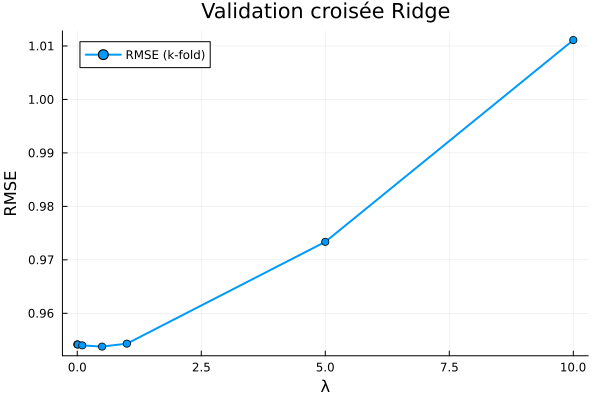

In [433]:
#Selection
y = df_train_oh[!, :consommation]
X = select(df_train_oh, predictor_cols)



# Normalisation uniquement des colonnes numériques spécifiées
X_normalized = normalize_selected_columns(X, numeric_columns)


# Ajout du biais
X_normalized_b = hcat(ones(size(X_normalized, 1)), X_normalized)

# Définition des valeurs de λ
λ_values = [1e-3,0.01, 0.1, 0.5, 1, 5, 10]

# Validation croisée (k-fold)
function k_fold_cross_validation(X, y, λ_values; k=5)
    n = size(X, 1)
    fold_size = div(n, k)
    rmse_values = zeros(length(λ_values))
    
    for (i, λ) in enumerate(λ_values)
        rmse_folds = []
        for fold in 1:k
            # Indices pour le fold actuel
            test_start= (fold - 1) * fold_size + 1
            test_end=min(fold * fold_size, n)
            test_indices=test_start:test_end
            train_indices=setdiff(1:n, test_indices)
            
            # Données pour le fold
            X_train=X[train_indices, :]
            y_train=y[train_indices]
            X_test=X[test_indices, :]
            y_test=y[test_indices]
            
            # Calcul des coefficients Ridge
            n_features=size(X_train, 2)
            β_ridge=(X_train' * X_train + λ * I(n_features)) \ (X_train' * y_train)
            
            # Prédiction et RMSE
            y_pred = X_test * β_ridge
            rmse_fold = sqrt(mean((y_test - y_pred).^2))
            push!(rmse_folds, rmse_fold)
        end
        # Moyenne des RMSE des k folds
        rmse_values[i] = mean(rmse_folds)  
    end
    
    return rmse_values
end

# Validation croisée
rmse_values = k_fold_cross_validation(X_normalized_b, y, λ_values, k=5)

# Les résultats
for (i, λ) in enumerate(λ_values)
    println("λ = ", λ, ", RMSE (k-fold) = ", rmse_values[i])
end

# meilleur lambda
best_index = argmin(rmse_values)
best_λ = λ_values[best_index]
println("\nMeilleur λ (k-fold): ", best_λ)

println("\nRMSE associé:", minimum(rmse_values))


# Calculer les coefficients optimaux avec le meilleur lambda
n_features = size(X_normalized_b, 2)
β_best = (X_normalized_b' * X_normalized_b + best_λ * I(n_features)) \ (X_normalized_b' * y)

# Afficher les coefficients optimaux
println("\nLes meilleurs coefficients β sont :")
println(β_best)

# Visualisation de l'effet de lambda sur le RMSE
Plots.plot(λ_values, rmse_values, label="RMSE (k-fold)", xlabel="λ", ylabel="RMSE", title="Validation croisée Ridge", lw=2, marker=:circle)

### 2.1.5 Régression Ridge, One hot encoding, Cross validation, Outlier removal et Standarisation essai avec des fonctions non linéaires


λ = 0.001, RMSE (k-fold) = 0.9541712749960626
λ = 0.01, RMSE (k-fold) = 0.9541528596334701
λ = 0.1, RMSE (k-fold) = 0.9539941052349501
λ = 0.5, RMSE (k-fold) = 0.9537669453922696
λ = 1.0, RMSE (k-fold) = 0.954318547583541
λ = 5.0, RMSE (k-fold) = 0.9733621699421923
λ = 10.0, RMSE (k-fold) = 1.0111051933346114
λ = 15.0, RMSE (k-fold) = 1.0552059012726582
λ = 20.0, RMSE (k-fold) = 1.1025638040773937
Meilleur λ (k-fold): 0.5
RMSE associé:0.9537669453922696
Les meilleurs coefficients β sont :
[5.796019230767091, 0.19445372791798263, 0.8070039917382646, 0.6853516522275692, -0.17590219441748647, 0.7486722733715189, 0.23154025166869532, 0.40618734924689365, 0.5106356853695149, 1.0649624930006178, 0.15659546277140315, 0.20778599586645255, 0.40800532554191543, 1.078868533690616, 0.1569197859419171, 0.2844459390465941, 0.7173023296697387, 0.746734504508241, 1.5928321620094221, 1.5862542765398087, 1.8701982877112802, 3.1598222590122056, 2.636196971755003]


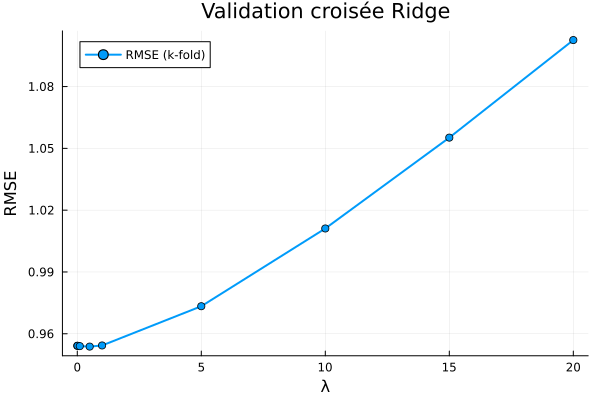

In [434]:
# Standarisation
X_stand= standardize_selected_columns(X, numeric_columns)

# Ajout du biais
X_stand_b = hcat(ones(size(X_stand, 1)), X_stand)

X_stand_b = Matrix(X_stand_b)

λ_values = [1e-3,0.01, 0.1, 0.5, 1, 5, 10,15,20]

# Validation croisée 
function k_fold_cross_validation(X, y, λ_values; k=5)
    n = size(X, 1)
    fold_size = div(n, k)
    rmse_values = zeros(length(λ_values))
    
    for (i, λ) in enumerate(λ_values)
        rmse_folds = []
        for fold in 1:k
            # Indices pour le fold actuel
            test_start = (fold - 1) * fold_size + 1
            test_end = min(fold * fold_size, n)
            test_indices = test_start:test_end
            train_indices = setdiff(1:n, test_indices)
            
            # Données pour le fold
            X_train = X[train_indices, :]
            y_train = y[train_indices]
            X_test = X[test_indices, :]
            y_test = y[test_indices]
            
            # Calcul des coefficients Ridge
            n_features = size(X_train, 2)
            β_ridge = (X_train' * X_train + λ * I(n_features)) \ (X_train' * y_train)
            
            # Prédiction et RMSE
            y_pred = X_test * β_ridge
            rmse_fold = sqrt(mean((y_test - y_pred).^2))
            push!(rmse_folds, rmse_fold)
        end
        rmse_values[i] = mean(rmse_folds)  # Moyenne des RMSE des k folds
    end
    
    return rmse_values
end

#validation croisée
rmse_values = k_fold_cross_validation(X_stand_b, y, λ_values, k=5)


for (i, λ) in enumerate(λ_values)
    println("λ = ", λ, ", RMSE (k-fold) = ", rmse_values[i])
end

# Trouver le meilleur λ
best_index = argmin(rmse_values)
best_λ = λ_values[best_index]
println("Meilleur λ (k-fold): ", best_λ)

println("RMSE associé:", minimum(rmse_values))

# Calculer les coefficients optimaux avec le meilleur lambda
n_features = size(X_normalized_b, 2)
β_best = (X_normalized_b' * X_normalized_b + best_λ * I(n_features)) \ (X_normalized_b' * y)

# Afficher les coefficients optimaux
println("Les meilleurs coefficients β sont :")
println(β_best)

# Visualisation de l'effet de lambda sur le RMSE
Plots.plot(λ_values, rmse_values, label="RMSE (k-fold)", xlabel="λ", ylabel="RMSE", title="Validation croisée Ridge", lw=2, marker=:circle)


### 3.Prédictions sur dataset du concours 

In [435]:
##Test
df_test=CSV.read("test.csv",DataFrame,decimal=',');
df_test[!, :cylindree_power] = df_test[!, :cylindree].^power
df_test_oh=onehot_encode(df_test,categorical_cols)


describe(df_test_oh)
X_test_pred = select(df_test_oh, predictor_cols)
X_test_pred_normalized = standardize_selected_columns(X_test_pred, numeric_columns)
X_test_pred_b = hcat(ones(size(X_test_pred_normalized, 1)), X_test_pred_normalized)
X_test_pred_b =Matrix(X_test_pred_b)

# Calcul des prédictions finales sur le dataset de test
y_pred_final = X_test_pred_b * β_best



# Ajout des prédictions au DataFrame de test
df_test[!, :consommation] = y_pred_final

# Sélection de la colonne des prédictions
predictions_df = select(df_test, :consommation)

# Ajouter la colonne 'id'
df_test[!, :id] = 1:nrow(df_test)

# DataFrame de soumission
submission_df = select(df_test, :id, :consommation)

# Sauvegarder le fichier de soumission
#CSV.write("predictions_hot_ridge_cross_sqrt.csv", submission_df)



Encodage one-hot de la colonne 'type' réussi.
Encodage one-hot de la colonne 'transmission' réussi.
Encodage one-hot de la colonne 'boite' réussi.


Row,id,consommation
,Int64,Float64
1,1,8.70182
2,2,8.17819
3,3,9.10277
4,4,9.49174
5,5,13.6843
6,6,12.7026
7,7,13.2262
8,8,9.86186
9,9,11.7686


**Notre meilleur score obtenu sur Kaggle est 0.0.85554 avec ce modèle (classé 4ème)**

### 4 Régression Bayésienne


Nous avons aussi tester la régression bayésienne. Cependant, cela n'a pas était un essai fructueu puisque ça ne nous donnait pas un meileur score que la régression ridge. Cela peut être dû au fait que les variables indépendantes n'ont pas une relation linéaire avec la variable dépendante (consommation).


Meilleur λ: 20.0
RMSE (régression bayésienne) : 0.4741824724231701
Coefficients a posteriori (M_N) : [-0.011266341625049407, 0.34480268633724614, 0.4328717390708992, -0.08186940814369288, 0.06614229769281606, -0.031008944681237008, 0.009745743820687748, -0.013960927671049346, 0.0596590921379703, 0.06351175950497842, -0.041664124984707014, 0.025159954815122336, -0.009200425398304566, -0.01402815449795081, 0.004711548261871131, 0.002531039027591834, 0.10518481514644719, 0.04369100441935854, -0.15843492465383355, 0.016271564319412388, -0.04870484705753197, 0.048704847057531094]


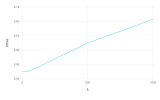

In [436]:
using CSV
using DataFrames
using Random
using LinearAlgebra
using Gadfly
using StatsBase

# 1. Fixer la graine pour la reproductibilité
Random.seed!(42)

# Charger les données (remplacer par vos données)
data = df_onehot

# 2. Définir la proportion d'entraînement
train_ratio = 0.80
n = nrow(data)
n_train = floor(Int, train_ratio * n)

# 3. Séparer les indices d'entraînement et de test
train_indices = sample(1:n, n_train, replace=false, ordered=true)
test_indices = setdiff(1:n, train_indices)

# 4. Créer les ensembles d'entraînement et de test
train = data[train_indices, :]
test = data[test_indices, :]

# 5. Séparation des caractéristiques et de la cible pour les ensembles d'entraînement et de test
y_train = train[:, :consommation]           # Cible pour l'entraînement
X_train = select(train, Not(:consommation)) # Caractéristiques pour l'entraînement

y_test = test[:, :consommation]             # Cible pour le test
X_test = select(test, Not(:consommation))   # Caractéristiques pour le test

# 6. Conversion en matrices
X_train_matrix = Matrix{Float64}(X_train)
X_test_matrix = Matrix{Float64}(X_test)
y_train_matrix = Vector{Float64}(y_train)
y_test_matrix = Vector{Float64}(y_test)

# 7. Standardisation des caractéristiques (X)
dt_X = StatsBase.fit(StatsBase.ZScoreTransform, X_train_matrix, dims=1)
X_train_standardized = StatsBase.transform(dt_X, X_train_matrix)
X_test_standardized = StatsBase.transform(dt_X, X_test_matrix)

# 8. Standardisation de la cible (y)
dt_y = StatsBase.fit(StatsBase.ZScoreTransform, y_train_matrix)
y_train_standardized = StatsBase.transform(dt_y, y_train_matrix)
y_test_standardized = StatsBase.transform(dt_y, y_test_matrix)

# 9. Définir les valeurs possibles de λ
λ_values = unique(sort([0.01, 0.1, 1, 10, 20, 50, 100, 150, 200, 500, 1000]))

# 10. Initialiser un DataFrame pour stocker les résultats
df = DataFrame(λ = Float64[], rmse = Float64[])

# 11. Calcul des coefficients de régression Ridge et évaluation du RMSE
n_features = size(X_train_standardized, 2)
I_matrix = Diagonal(ones(n_features))  # Matrice identité

for λ in λ_values
    # Calcul des coefficients de régression Ridge
    β_ridge = (X_train_standardized' * X_train_standardized + λ * I_matrix) \ (X_train_standardized' * y_train_standardized)

    # Prédictions sur le jeu de test
    y_pred = X_test_standardized * β_ridge

    # Calcul du RMSE
    rmse = StatsBase.rmsd(y_pred, y_test_standardized)

    # Stocker les résultats dans le DataFrame
    push!(df, [λ, rmse])
end

# 12. Trouver le λ qui minimise le RMSE
best_λ = df.λ[argmin(df.rmse)]
println("Meilleur λ: ", best_λ)

# 13. Régression bayésienne
X = X_train_standardized
y = y_train_standardized

# Calcul des coefficients Ridge avec le meilleur λ
β̂ = (X' * X + best_λ * I_matrix) \ (X' * y)

# Estimation de la variance du bruit
s²_λ = (y'y - β̂' * (X' * X + best_λ * I_matrix) * β̂) / n

# Matrice de covariance a posteriori
Σ = s²_λ * inv(X' * X + best_λ * I_matrix)

# Calcul des coefficients a posteriori
S_0_inv = (1 / s²_λ) * I_matrix
S_N_inv = inv((X' * X) + S_0_inv)
M_N = S_N_inv * (X' * y)

# Prédictions avec les coefficients a posteriori
y_pred_bayes = X_test_standardized * M_N

# Calcul du RMSE pour la régression bayésienne
rmse_bayes = sqrt(mean((y_pred_bayes .- y_test_standardized).^2))
println("RMSE (régression bayésienne) : ", rmse_bayes)

# Affichage des coefficients a posteriori
println("Coefficients a posteriori (M_N) : ", M_N)

# 15. Affichage des résultats
Gadfly.plot(df, x=:λ, y=:rmse, Geom.line)

## Conclusion et améliorations

#### Pistes avortées
Nous avons souvent essayé de tester d'autres modèles GLM, autres que la régression linéaire simple (comme la régression inverse de Gamma, par exemple), cependant, les résultats n'étaient généralement pas au rendez-vous.

Nous avons également tenté de réaliser une analyse en composantes principales (PCA), mais les résultats n'étaient là aussi pas au rendez-vous. Une piste probable est que le dataset est petit. Ainsi, la réduction de dimension peut parfois entraîner une perte d'information significative, ce qui peut affecter les performances des modèles d'apprentissage.

#### Conclusion 

Nous avons choisi une approche simple : une régression linéaire qui utilise la meilleure combinaison possible de variables explicatives en les évaluant de manière exhaustive selon la RMSE (Root Mean Square Error). L'exploration des données nous a permis de découvrir que la cylindrée et le nombre de cylindres semblaient avoir un impact important sur la consommation à prédire. Nous avons ensuite préparé notre DataFrame principal en gérant les outliers et en encodant les variables catégoriques. Nous avons appliqué notre méthodologie sur un ensemble d'entraînement et de validation pour nos régressions ridges afin de nous donner une idée de la performance du modèle. Enfin, nous avons appliqué le meilleur modèle trouvé à ce jour pour prédire les consommations pour les véhicules de l'ensemble des données du concours. Une autre conclusion est que les modèles les plus simples peuvent parfois donner de meilleurs résultats. Nous n'avons pas réussi à améliorer nos performances avec des modèles plus compliqués (GLM ou régression bayésienne également).

#### Idées d'améliorations

Les résultats restent très corrects dans l'ensemble. Nous avons identifié les pistes d'amélioration suivantes :
 - Tester plus de combinaisons de variables explicatives auxquelles nous pourrions appliquer des fonctions non linéaires.
 - Tester le modèle des arbres de régression.
 - Faire de la data augmentation afin d'avoir plus d'exemples pour l'entraînement de nos modèles.
 - Étude visant à comprendre pourquoi nos prédictions sur Kaggle ont une RMSE moins grande que celles sur nos ensembles de test issus du dataset d'entraînement donné.
